## To Do

Clean up code:
    get my sqlite file
    filter by price and remove all duplicates
    get URLs 
    only run your code to get the vintages:
        run through all vintages instead of recommended 
        add taset prfile % ****
        price for bottles if there 
        

        

    

In [3]:
import os
import json
import pandas as pd
import seaborn as sns
from datetime import datetime
import matplotlib.pylab as plt
import requests
from bs4 import BeautifulSoup
import sqlite3
import re
from selenium import webdriver
from selenium.webdriver.common.by import By

# Configure Notebook
%matplotlib inline
plt.style.use('fivethirtyeight')
sns.set_context("notebook")
import warnings
warnings.filterwarnings('ignore')

In [4]:
conn = sqlite3.connect('red_wines_final 1.db')
c = conn.cursor()
wine_df = pd.read_sql_query("SELECT * FROM red_wines", conn)
wine_df = wine_df.sort_values(by='Price', ascending = False)
wine_df_filtered=wine_df.drop_duplicates(subset=['Producer', 'WineType'], keep = 'first')
wine_df_filtered['URL']

1585     https://www.vivino.com/bacigalupi-zinfandel/w/...
313      https://www.vivino.com/domaine-de-la-romanee-c...
366      https://www.vivino.com/le-pin-pomerol/w/119749...
126      https://www.vivino.com/chateau-petrus-pomerol/...
1676     https://www.vivino.com/domaine-arnoux-lachaux-...
                               ...                        
22214    https://www.vivino.com/woodbridge-by-robert-mo...
21809    https://www.vivino.com/delheim-cabernet-sauvig...
22259    https://www.vivino.com/santa-carolina-cabernet...
22213    https://www.vivino.com/felix-solis-los-molinos...
22166    https://www.vivino.com/crane-lake-pinot-noir/w...
Name: URL, Length: 11240, dtype: object

In [ ]:
# Initialize lists to store the extracted data
all_recommended_vintages = []
all_vintages_data = []
failed_urls = []

row = wine_df_filtered.iloc[0]  
url = row['URL']  
print(f"Processing URL: {url}") 

# Extract producer, wine type, region, country for the current wine
producer = row['Producer']
winetype = row['WineType']
region_name = row['Region']
country_name = row['Country']

try:
    r = requests.get(url, headers={
        "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:66.0) Gecko/20100101 Firefox/66.0"
    })

    # Check if the request was successful
    if r.status_code == 200:
        # Search for the JavaScript data in the page source
        res = re.search(r"window\.__PRELOADED_STATE__\.winePageInformation\s*=\s*(.*});", r.text, re.MULTILINE)
        
        if res:
            data = json.loads(res.group(1))
            
            # Extract taste information
            taste = data.get('highlights', [{}])[0].get('metadata', {}).get('style', {}).get('baseline_structure', {})
            acidity = taste.get("acidity", None)
            fizziness = taste.get("fizziness", None)
            intensity = taste.get("intensity", None)
            sweetness = taste.get("sweetness", None)
            tannin = taste.get("tannin", None)
            
            # Extract recommended vintages
            recommended_vintages = data.get("recommended_vintages", [])
            if recommended_vintages:
                recommended_df = pd.DataFrame(recommended_vintages)
                recommended_df['source_url'] = url  # Add the URL for reference
                # Add the wine details from 'wine_df_filtered' directly
                recommended_df['Producer'] = producer
                recommended_df['WineType'] = winetype
                recommended_df['Region'] = region_name
                recommended_df['Country'] = country_name
                # Add taste information
                recommended_df['Acidity'] = acidity
                recommended_df['Fizziness'] = fizziness
                recommended_df['Intensity'] = intensity
                recommended_df['Sweetness'] = sweetness
                recommended_df['Tannin'] = tannin
                all_recommended_vintages.append(recommended_df)

            # Extract all vintages
            all_vintages = data.get("wine", {}).get("vintages", [])
            if all_vintages:
                all_vintages_df = pd.DataFrame(all_vintages)
                all_vintages_df['source_url'] = url  # Add the URL for reference
                # Add the wine details from 'wine_df_filtered' directly
                all_vintages_df['Producer'] = producer
                all_vintages_df['WineType'] = winetype
                all_vintages_df['Region'] = region_name
                all_vintages_df['Country'] = country_name
                # Add taste information
                all_vintages_df['Acidity'] = acidity
                all_vintages_df['Fizziness'] = fizziness
                all_vintages_df['Intensity'] = intensity
                all_vintages_df['Sweetness'] = sweetness
                all_vintages_df['Tannin'] = tannin
                all_vintages_data.append(all_vintages_df)

        else:
            print(f"No data found for URL: {url}")
            failed_urls.append(url)  # Append failed URL
    else:
        print(f"Failed to retrieve data for URL: {url}, Status code: {r.status_code}")
        failed_urls.append(url) 

except Exception as e:
    print(f"An error occurred for URL: {url} - {str(e)}")
    failed_urls.append(url) 

# Concatenate all the recommended vintages and all vintages data into DataFrames
if all_recommended_vintages:
    final_recommended_vintages_df = pd.concat(all_recommended_vintages, ignore_index=True)
else:
    final_recommended_vintages_df = pd.DataFrame()  # Empty DataFrame if no data

if all_vintages_data:
    final_all_vintages_df = pd.concat(all_vintages_data, ignore_index=True)
else:
    final_all_vintages_df = pd.DataFrame()  

# Display the final extracted data
print("\nExtracted Recommended Vintages Data:")
print(final_recommended_vintages_df)

print("\nExtracted All Vintages Data:")
print(final_all_vintages_df)

# Display the failed URL if any
if failed_urls:
    print("\nFailed URLs:")
    print(failed_urls)
else:
    print("\nNo failed URLs.")

# Save the recommended vintages and all vintages DataFrames to CSV files
# final_recommended_vintages_df.to_csv("recommended_vintages.csv", index=False)
# final_all_vintages_df.to_csv("all_vintages.csv", index=False)

print("\nCSV files saved successfully.")


Processing URL: https://www.vivino.com/bacigalupi-zinfandel/w/2259925

Extracted Recommended Vintages Data:
                                             vintage             type  \
0  {'id': 147519855, 'seo_name': 'bacigalupi-zinf...  best_user_rated   
1  {'id': 154248950, 'seo_name': 'bacigalupi-zinf...  most_user_rated   
2  {'id': 167792546, 'seo_name': 'bacigalupi-zinf...       top_ranked   

                                      highlight_icon  \
0  https://images.vivino.com/highlights/icon/best...   
1  https://images.vivino.com/highlights/icon/most...   
2  https://images.vivino.com/highlights/icon/top_...   

                                               price  \
0                                               None   
1  {'id': 30889819, 'type': 'ppc', 'amount': 5451...   
2                                               None   

                                          source_url    Producer   WineType  \
0  https://www.vivino.com/bacigalupi-zinfandel/w/...  Bacigalupi  Zinf

In [80]:
final_recommended_vintages_df

,vintage,type,highlight_icon,price,source_url,Producer,WineType,Region,Country,Acidity,Fizziness,Intensity,Sweetness,Tannin
0,"{'id': 147519855, 'seo_name': 'bacigalupi-zinf...",best_user_rated,https://images.vivino.com/highlights/icon/best...,None,https://www.vivino.com/bacigalupi-zinfandel/w/...,Bacigalupi,Zinfandel,Russian River Valley,United States,1.5,None,5.0,2.0,2.5
1,"{'id': 154248950, 'seo_name': 'bacigalupi-zinf...",most_user_rated,https://images.vivino.com/highlights/icon/most...,"{'id': 30889819, 'type': 'ppc', 'amount': 5451...",https://www.vivino.com/bacigalupi-zinfandel/w/...,Bacigalupi,Zinfandel,Russian River Valley,United States,1.5,None,5.0,2.0,2.5
2,"{'id': 167792546, 'seo_name': 'bacigalupi-zinf...",top_ranked,https://images.vivino.com/highlights/icon/top_...,None,https://www.vivino.com/bacigalupi-zinfandel/w/...,Bacigalupi,Zinfandel,Russian River Valley,United States,1.5,None,5.0,2.0,2.5
3,"{'id': 1309310, 'seo_name': 'domaine-de-la-rom...",wsa_winning,https://images.vivino.com/highlights/icon/wsa_...,None,https://www.vivino.com/domaine-de-la-romanee-c...,Domaine de La Romanée-Conti,Romanée-Conti Grand Cru,Romanée-Conti Grand Cru,France,4.5,None,3.0,1.0,2.5
4,"{'id': 159459464, 'seo_name': 'domaine-de-la-r...",best_user_rated,https://images.vivino.com/highlights/icon/best...,None,https://www.vivino.com/domaine-de-la-romanee-c...,Domaine de La Romanée-Conti,Romanée-Conti Grand Cru,Romanée-Conti Grand Cru,France,4.5,None,3.0,1.0,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37335,"{'id': 1359262, 'seo_name': 'santa-carolina-ca...",most_user_rated,https://images.vivino.com/highlights/icon/most...,None,https://www.vivino.com/santa-carolina-cabernet...,Santa Carolina,Cabernet Sauvignon (Varietal),Rapel Valley,Chile,3.0,None,4.5,1.0,3.5
37336,"{'id': 147835980, 'seo_name': 'felix-solis-los...",best_user_rated,https://images.vivino.com/highlights/icon/best...,None,https://www.vivino.com/felix-solis-los-molinos...,Félix Solís,Los Molinos Valdepeñas Crianza,Valdepeñas,Spain,2.5,None,4.5,1.0,4.0
37337,"{'id': 101140534, 'seo_name': 'felix-solis-los...",most_user_rated,https://images.vivino.com/highlights/icon/most...,None,https://www.vivino.com/felix-solis-los-molinos...,Félix Solís,Los Molinos Valdepeñas Crianza,Valdepeñas,Spain,2.5,None,4.5,1.0,4.0
37338,"{'id': 1236043, 'seo_name': 'crane-lake-pinot-...",best_user_rated,https://images.vivino.com/highlights/icon/best...,None,https://www.vivino.com/crane-lake-pinot-noir/w...,Crane Lake,Pinot Noir,California,United States,3.5,None,3.0,1.0,2.0


In [81]:
final_all_vintages_df

,id,seo_name,name,statistics,year,grapes,has_valid_ratings,source_url,Producer,WineType,Region,Country,Acidity,Fizziness,Intensity,Sweetness,Tannin
0,176916427,bacigalupi-zinfandel-2022,Bacigalupi Zinfandel 2022,"{'status': 'BelowThreshold', 'ratings_count': ...",2022,None,False,https://www.vivino.com/bacigalupi-zinfandel/w/...,Bacigalupi,Zinfandel,Russian River Valley,United States,1.5,None,5.0,2.0,2.5
1,173856042,bacigalupi-zinfandel-2021,Bacigalupi Zinfandel 2021,"{'status': 'BelowThreshold', 'ratings_count': ...",2021,None,False,https://www.vivino.com/bacigalupi-zinfandel/w/...,Bacigalupi,Zinfandel,Russian River Valley,United States,1.5,None,5.0,2.0,2.5
2,171559100,bacigalupi-zinfandel-2020,Bacigalupi Zinfandel 2020,"{'status': 'BelowThreshold', 'ratings_count': ...",2020,None,False,https://www.vivino.com/bacigalupi-zinfandel/w/...,Bacigalupi,Zinfandel,Russian River Valley,United States,1.5,None,5.0,2.0,2.5
3,167792546,bacigalupi-zinfandel-2019,Bacigalupi Zinfandel 2019,"{'status': 'BelowThreshold', 'ratings_count': ...",2019,None,False,https://www.vivino.com/bacigalupi-zinfandel/w/...,Bacigalupi,Zinfandel,Russian River Valley,United States,1.5,None,5.0,2.0,2.5
4,164394048,bacigalupi-zinfandel-2018,Bacigalupi Zinfandel 2018,"{'status': 'BelowThreshold', 'ratings_count': ...",2018,None,False,https://www.vivino.com/bacigalupi-zinfandel/w/...,Bacigalupi,Zinfandel,Russian River Valley,United States,1.5,None,5.0,2.0,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409137,68836723,crane-lake-pinot-noir-1993,Crane Lake Pinot Noir 1993,"{'status': 'BelowThreshold', 'ratings_count': ...",1993,None,False,https://www.vivino.com/crane-lake-pinot-noir/w...,Crane Lake,Pinot Noir,California,United States,3.5,None,3.0,1.0,2.0
409138,163293956,crane-lake-pinot-noir-1991,Crane Lake Pinot Noir 1991,"{'status': 'BelowThreshold', 'ratings_count': ...",1991,None,False,https://www.vivino.com/crane-lake-pinot-noir/w...,Crane Lake,Pinot Noir,California,United States,3.5,None,3.0,1.0,2.0
409139,38590533,crane-lake-pinot-noir-1978,Crane Lake Pinot Noir 1978,"{'status': 'BelowThreshold', 'ratings_count': ...",1978,None,False,https://www.vivino.com/crane-lake-pinot-noir/w...,Crane Lake,Pinot Noir,California,United States,3.5,None,3.0,1.0,2.0
409140,24872659,crane-lake-pinot-noir-1976,Crane Lake Pinot Noir 1976,"{'status': 'BelowThreshold', 'ratings_count': ...",1976,None,False,https://www.vivino.com/crane-lake-pinot-noir/w...,Crane Lake,Pinot Noir,California,United States,3.5,None,3.0,1.0,2.0


In [86]:
# Extract key-value pairs from the 'statistics' column and create new columns
def extract_object_data(object_data):
    """Extracts key-value pairs from an object and returns a Series."""
    if isinstance(object_data, dict):
        return pd.Series(object_data)
    else:
        return pd.Series()  # Handle other data types if needed

# Apply the function to 'statistics' and create a new DataFrame
new_columns = final_all_vintages_df_True['statistics'].apply(extract_object_data)

# Concatenate the extracted columns with the original DataFrame
final_all_vintages_df_True = pd.concat([final_all_vintages_df_True, new_columns], axis=1)

# Define the selected columns for the new DataFrame, including Producer, WineType, Region, and Country
selected_columns = [
    'id', 'name', 'year', 'ratings_average', 'reviews_count', 
    'has_valid_ratings', 'Acidity', 'Intensity', 'Sweetness', 'Tannin',
    'Region', 'Country', 'Producer', 'WineType'  # Include Producer and WineType
]

# Create the final DataFrame with the selected columns
df4 = final_all_vintages_df_True[selected_columns]

# Display the final DataFrame
df4

# Save the final DataFrame to a CSV file (optional)
# df4.to_csv("final_all_vintages_with_producer_winetype.csv", index=False)


,id,name,year,ratings_average,ratings_average,ratings_average,reviews_count,reviews_count,reviews_count,has_valid_ratings,Acidity,Intensity,Sweetness,Tannin,Region,Country,Producer,WineType
6,147519855,Bacigalupi Zinfandel 2016,2016,4.5,4.5,4.5,20,20,20,True,1.5,5.0,2.0,2.5,Russian River Valley,United States,Bacigalupi,Zinfandel
7,154248950,Bacigalupi Zinfandel 2015,2015,4.4,4.4,4.4,14,14,14,True,1.5,5.0,2.0,2.5,Russian River Valley,United States,Bacigalupi,Zinfandel
22,4971178,Bacigalupi Zinfandel,0,4.4,4.4,4.4,3,3,3,True,1.5,5.0,2.0,2.5,Russian River Valley,United States,Bacigalupi,Zinfandel
26,162909346,Domaine de La Romanée-Conti Romanée-Conti Gran...,2020,4.7,4.7,4.7,14,14,14,True,4.5,3.0,1.0,2.5,Romanée-Conti Grand Cru,France,Domaine de La Romanée-Conti,Romanée-Conti Grand Cru
27,159459464,Domaine de La Romanée-Conti Romanée-Conti Gran...,2019,4.9,4.9,4.9,18,18,18,True,4.5,3.0,1.0,2.5,Romanée-Conti Grand Cru,France,Domaine de La Romanée-Conti,Romanée-Conti Grand Cru
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409122,2175427,Crane Lake Pinot Noir 2012,2012,3.0,3.0,3.0,86,86,86,True,3.5,3.0,1.0,2.0,California,United States,Crane Lake,Pinot Noir
409123,1377237,Crane Lake Pinot Noir 2011,2011,2.9,2.9,2.9,27,27,27,True,3.5,3.0,1.0,2.0,California,United States,Crane Lake,Pinot Noir
409124,1236043,Crane Lake Pinot Noir 2010,2010,3.6,3.6,3.6,6,6,6,True,3.5,3.0,1.0,2.0,California,United States,Crane Lake,Pinot Noir
409125,1171623,Crane Lake Pinot Noir 2009,2009,3.3,3.3,3.3,13,13,13,True,3.5,3.0,1.0,2.0,California,United States,Crane Lake,Pinot Noir


In [94]:
final_recommended_vintages_df['id'] = final_recommended_vintages_df['vintage'].apply(lambda x: x['id'] if 'id' in x else None)
final_recommended_vintages_df['name'] = final_recommended_vintages_df['vintage'].apply(lambda x: x['name'] if 'name' in x else None)
final_recommended_vintages_df['amount'] = final_recommended_vintages_df['price'].apply(lambda x: x['amount'] if isinstance(x, dict) and 'amount' in x else None)
# final_recommended_df

selected_columns = ['id',  'name' ,'type', 'amount']
df5 = final_recommended_vintages_df[selected_columns]
df5

,id,name,type,amount
0,147519855,Bacigalupi Zinfandel 2016,best_user_rated,NaN
1,154248950,Bacigalupi Zinfandel 2015,most_user_rated,54513.9
2,167792546,Bacigalupi Zinfandel 2019,top_ranked,NaN
3,1309310,Domaine de La Romanée-Conti Romanée-Conti Gran...,wsa_winning,NaN
4,159459464,Domaine de La Romanée-Conti Romanée-Conti Gran...,best_user_rated,NaN
...,...,...,...,...
37335,1359262,Santa Carolina Cabernet Sauvignon (Varietal) 2011,most_user_rated,NaN
37336,147835980,Félix Solís Los Molinos Valdepeñas Crianza 2016,best_user_rated,NaN
37337,101140534,Félix Solís Los Molinos Valdepeñas Crianza 2015,most_user_rated,NaN
37338,1236043,Crane Lake Pinot Noir 2010,best_user_rated,NaN


In [ ]:
# Drop duplicate columns in df4
df4 = df4.loc[:, ~df4.columns.duplicated()]

# Merge DataFrames
final_merge_df = pd.merge(df4, df5, on="id", how="outer")

# Check columns after merge
print("final_merge_df columns:", final_merge_df.columns)

# Define selected columns with 'Producer'
selected_columns = [
    'id', 'name_x', 'Country', 'Region','Producer', 'WineType', 'year', 'has_valid_ratings',
    'ratings_average', 'reviews_count', 'amount', 'type', 'Tannin',
    'Acidity', 'Intensity', 'Sweetness' 
]

# Create the wine bottle vintage DataFrame
all_winebottlevintage_df = final_merge_df[selected_columns]

# Convert columns to numeric
all_winebottlevintage_df['year'] = pd.to_numeric(all_winebottlevintage_df['year'], errors='coerce')
all_winebottlevintage_df['ratings_average'] = pd.to_numeric(all_winebottlevintage_df['ratings_average'], errors='coerce')
all_winebottlevintage_df['reviews_count'] = pd.to_numeric(all_winebottlevintage_df['reviews_count'], errors='coerce')

# Filter DataFrame
all_filtered_winebottle_v1 = all_winebottlevintage_df[
    (all_winebottlevintage_df['year'] >= 1990) &
    (all_winebottlevintage_df['ratings_average'] > 3) &
    (all_winebottlevintage_df['reviews_count'] > 1)
].sort_values(by='name_x', ascending=False, na_position='last')

# Display the filtered DataFrame
pd.set_option('display.max_rows', 3000)
pd.set_option('display.max_columns', None)
all_filtered_winebottle_v1
# Save the final DataFrame to a CSV file (optional)
# all_filtered_winebottle_v1.to_csv("all_filtered_winebottle_v1.csv", index=False)

final_merge_df columns: Index(['id', 'name_x', 'year', 'ratings_average', 'reviews_count',
       'has_valid_ratings', 'Acidity', 'Intensity', 'Sweetness', 'Tannin',
       'Region', 'Country', 'Producer', 'WineType', 'name_y', 'type',
       'amount'],
      dtype='object')


In [121]:
all_filtered_winebottle_v1

,id,name_x,Country,Region,Producer,WineType,year,has_valid_ratings,ratings_average,reviews_count,amount,type,Tannin,Acidity,Intensity,Sweetness
135617,172970038,È Jamu Zimbato Chianti 2021,Italy,Chianti,È Jamu,Zimbato Chianti,2021.0,True,4.0,8.0,NaN,best_user_rated,4.0,4.0,3.0,1.0
126441,165847548,È Jamu Zimbato Chianti 2019,Italy,Chianti,È Jamu,Zimbato Chianti,2019.0,True,3.9,17.0,NaN,most_user_rated,4.0,4.0,3.0,1.0
125409,164918292,Áster Crianza 2020,Spain,Ribera del Duero,Áster,Crianza,2020.0,True,4.1,107.0,NaN,best_user_rated,4.0,4.0,4.0,1.0
113749,159738134,Áster Crianza 2019,Spain,Ribera del Duero,Áster,Crianza,2019.0,True,4.0,132.0,NaN,NaN,4.0,4.0,4.0,1.0
88672,143423814,Áster Crianza 2016,Spain,Ribera del Duero,Áster,Crianza,2016.0,True,4.1,202.0,NaN,top_ranked,4.0,4.0,4.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131105,168770279,100 Nails Ranch Pinot Noir 2020,United States,Central Coast,100 Nails Ranch,Pinot Noir,2020.0,True,3.8,36.0,NaN,best_user_rated,2.0,3.5,3.0,1.0
128580,167314372,100 Nails Ranch Pinot Noir 2019,United States,Central Coast,100 Nails Ranch,Pinot Noir,2019.0,True,3.5,18.0,NaN,most_user_rated,2.0,3.5,3.0,1.0
130382,168233793,100 Nails Ranch Cabernet Sauvignon 2020,United States,Paso Robles,100 Nails Ranch,Cabernet Sauvignon,2020.0,True,3.7,45.0,39.19,most_user_rated,4.5,3.5,5.0,1.0
127433,166756066,100 Nails Ranch Cabernet Sauvignon 2019,United States,Paso Robles,100 Nails Ranch,Cabernet Sauvignon,2019.0,True,3.8,24.0,NaN,best_user_rated,4.5,3.5,5.0,1.0


In [ ]:
all_filtered_winebottle_v1.to_csv(r'C:\Users\masca\Downloads\all_filtered_winebottle_v1.csv', index = True)


In [3]:
all_filtered_winebottle_v1 = pd.read_csv('all_filtered_winebottle_v1.csv')

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
# Handle NaN values in the 'amount' column
all_filtered_winebottle_v1['amount'] = pd.to_numeric(all_filtered_winebottle_v1['amount'], errors='coerce')  # Ensure 'amount' is numeric
all_filtered_winebottle_v1_clean = all_filtered_winebottle_v1[all_filtered_winebottle_v1['amount'].notna()]  # Drop rows where 'amount' is NaN

# Filter data to only include years from 2000 to 2024
all_filtered_winebottle_v1_clean = all_filtered_winebottle_v1_clean[(all_filtered_winebottle_v1_clean['year'] >= 2000) & (all_filtered_winebottle_v1_clean['year'] <= 2024)]

# Filter wines with a minimum number of reviews (e.g., 1000 reviews)
all_filtered_winebottle_v1_clean = all_filtered_winebottle_v1_clean[all_filtered_winebottle_v1_clean['reviews_count'] >= 100]

# Check the distribution of the 'amount' column to understand if the 10-30 range has data
amount_distribution = all_filtered_winebottle_v1_clean['amount'].describe()
print(f"Amount Distribution:\n{amount_distribution}")

# Create separate plots based on amount ranges
amount_ranges = [(10, 30), (30, 100), (100, 200), (200, float('inf'))]
range_labels = ['10-30', '30-100', '100-200', '200+']

plt.figure(figsize=(12, 10))

# Loop through each amount range and create a subplot for each range
for i, (min_amount, max_amount) in enumerate(amount_ranges):
    plt.subplot(2, 2, i+1)  # Create a 2x2 grid of subplots
    
    # Filter data by amount range
    filtered_data = all_filtered_winebottle_v1_clean[(all_filtered_winebottle_v1_clean['amount'] >= min_amount) & (all_filtered_winebottle_v1_clean['amount'] < max_amount)]
    
    # Check if there is any data to plot
    if filtered_data.empty:
        plt.text(0.5, 0.5, 'No data to plot', horizontalalignment='center', verticalalignment='center', fontsize=12, color='red')
        plt.title(f'No data in Amount Range {range_labels[i]}')
    else:
        # Plot year vs ratings_average for the filtered data
        for name_x, group in filtered_data.groupby('name_x'):
            plt.plot(group['year'], group['ratings_average'], marker='o', label=name_x)
        
        # Add labels, title, and legend
        plt.xlabel('Year')
        plt.ylabel('Ratings Average')
        plt.title(f'Year vs Ratings Average for Amount {range_labels[i]}')
        plt.legend(title='Wine Name', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
        plt.grid(True)

# Adjust layout for better visualization
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for the legend
plt.show()


Amount Distribution:
count    2609.000000
mean       68.459249
std        80.549211
min         9.720000
25%        32.200000
50%        46.190000
75%        74.190000
max      1624.990000
Name: amount, dtype: float64


C:\Users\masca\AppData\Local\Temp\ipykernel_38648\2584633529.py:48: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for the legend


Amount Distribution:
count    2609.000000
mean       68.459249
std        80.549211
min         9.720000
25%        32.200000
50%        46.190000
75%        74.190000
max      1624.990000
Name: amount, dtype: float64


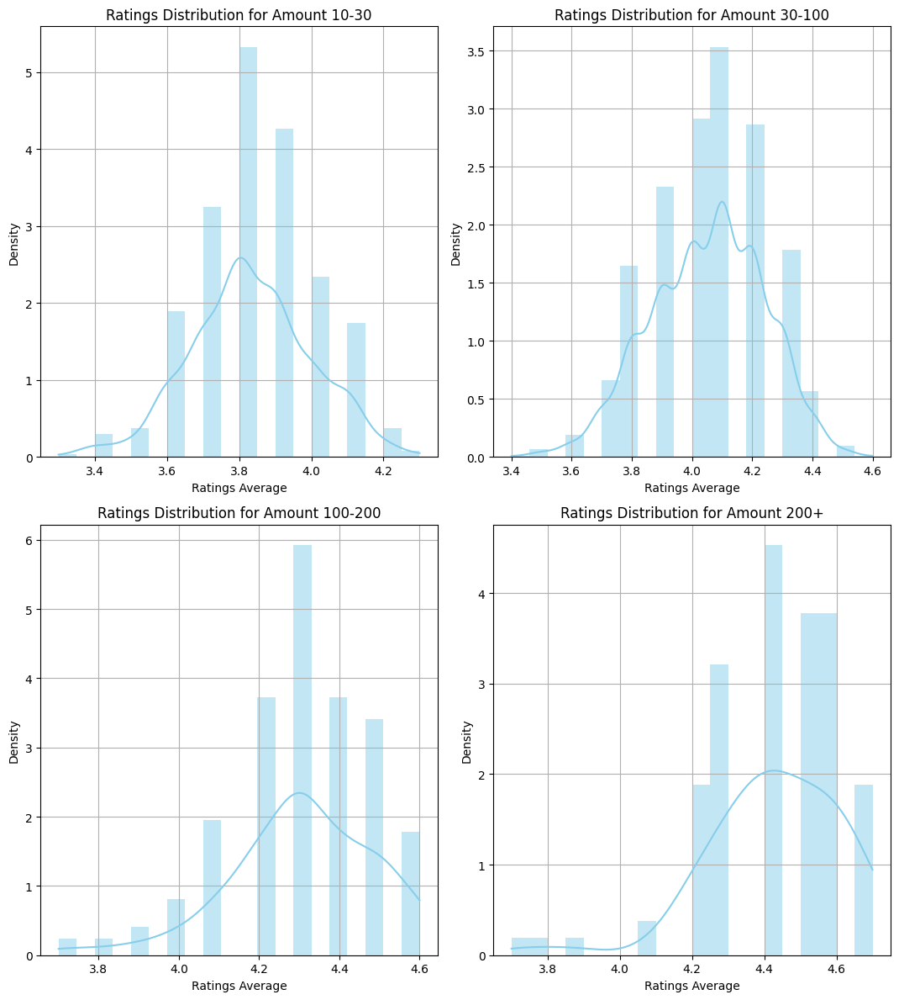

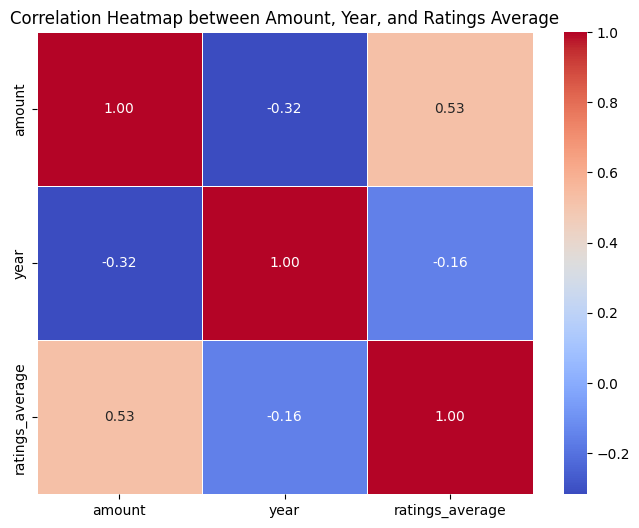

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Handle NaN values in the 'amount' column
all_filtered_winebottle_v1['amount'] = pd.to_numeric(all_filtered_winebottle_v1['amount'], errors='coerce')  # Ensure 'amount' is numeric
all_filtered_winebottle_v1_clean = all_filtered_winebottle_v1[all_filtered_winebottle_v1['amount'].notna()]  # Drop rows where 'amount' is NaN

# Filter data to only include years from 2000 to 2024
all_filtered_winebottle_v1_clean = all_filtered_winebottle_v1_clean[(all_filtered_winebottle_v1_clean['year'] >= 2000) & (all_filtered_winebottle_v1_clean['year'] <= 2024)]

# Filter wines with a minimum number of reviews (e.g., 100 reviews)
all_filtered_winebottle_v1_clean = all_filtered_winebottle_v1_clean[all_filtered_winebottle_v1_clean['reviews_count'] >= 100]

# Check the distribution of the 'amount' column to understand if the 10-30 range has data
amount_distribution = all_filtered_winebottle_v1_clean['amount'].describe()
print(f"Amount Distribution:\n{amount_distribution}")

# Create separate plots based on amount ranges
amount_ranges = [(10, 30), (30, 100), (100, 200), (200, float('inf'))]
range_labels = ['10-30', '30-100', '100-200', '200+']

plt.figure(figsize=(12, 12))

# Loop through each amount range and create a subplot for each range
for i, (min_amount, max_amount) in enumerate(amount_ranges):
    plt.subplot(2, 2, i+1)  # Create a 2x2 grid of subplots
    
    # Filter data by amount range
    filtered_data = all_filtered_winebottle_v1_clean[(all_filtered_winebottle_v1_clean['amount'] >= min_amount) & (all_filtered_winebottle_v1_clean['amount'] < max_amount)]
    
    # Check if there is any data to plot
    if filtered_data.empty:
        plt.text(0.5, 0.5, 'No data to plot', horizontalalignment='center', verticalalignment='center', fontsize=12, color='red')
        plt.title(f'No data in Amount Range {range_labels[i]}')
    else:
        # Plot histogram for ratings_average in each amount range
        sns.histplot(filtered_data['ratings_average'], kde=True, bins=20, color='skyblue', stat='density', linewidth=0)
        
        # Add labels, title
        plt.xlabel('Ratings Average')
        plt.ylabel('Density')
        plt.title(f'Ratings Distribution for Amount {range_labels[i]}')
        
    # Add grid
    plt.grid(True)

# Adjust layout for better visualization
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for the legend
plt.show()



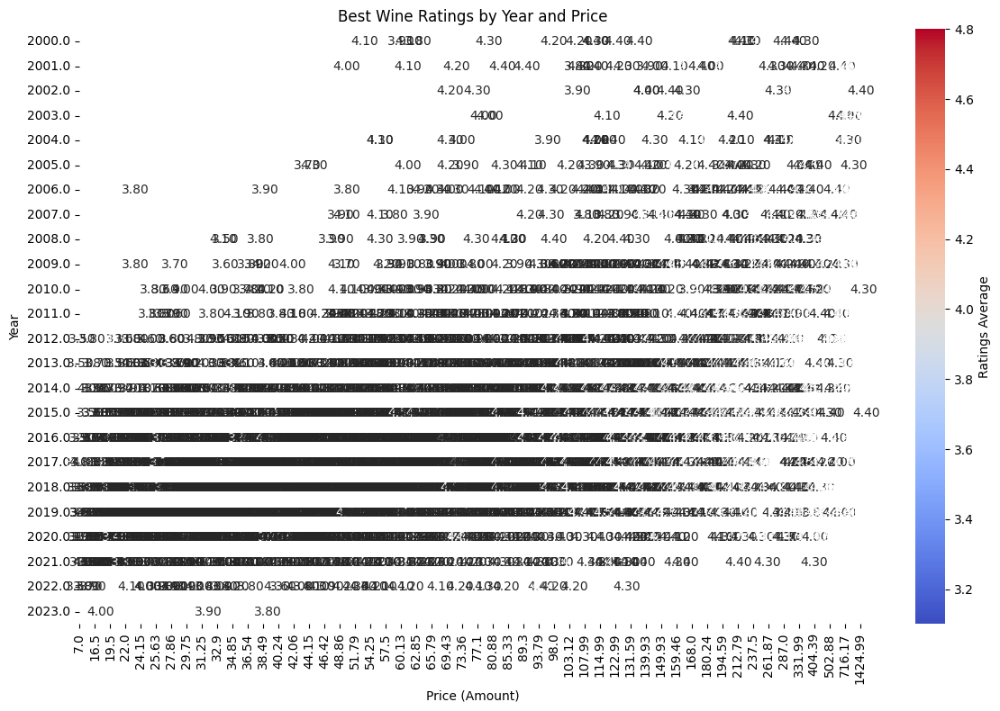

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Handle NaN values in the 'amount' column
all_filtered_winebottle_v1['amount'] = pd.to_numeric(all_filtered_winebottle_v1['amount'], errors='coerce')  # Ensure 'amount' is numeric
all_filtered_winebottle_v1_clean = all_filtered_winebottle_v1[all_filtered_winebottle_v1['amount'].notna()]  # Drop rows where 'amount' is NaN

# Filter data to only include years from 2000 to 2024
all_filtered_winebottle_v1_clean = all_filtered_winebottle_v1_clean[(all_filtered_winebottle_v1_clean['year'] >= 2000) & (all_filtered_winebottle_v1_clean['year'] <= 2024)]

# Filter wines with a minimum number of reviews (e.g., 100 reviews)
all_filtered_winebottle_v1_clean = all_filtered_winebottle_v1_clean[all_filtered_winebottle_v1_clean['reviews_count'] >= 10]

# Group by 'year' and 'amount', and get the maximum 'ratings_average' for each combination of 'year' and 'amount'
heatmap_data = all_filtered_winebottle_v1_clean.groupby(['year', 'amount'])['ratings_average'].max().unstack()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, fmt='.2f', cmap='coolwarm', cbar_kws={'label': 'Ratings Average'}, linewidths=0.5)

# Add labels and title
plt.title('Best Wine Ratings by Year and Price')
plt.xlabel('Price (Amount)')
plt.ylabel('Year')

# Show the plot
plt.tight_layout()
plt.show()


Best Wine Without Normalizing:
                                                  name_x    year  amount  \
85289  Cono Sur Bicicleta Reserva Cabernet Sauvignon ...  2022.0     7.0   

       ratings_average  Acidity  Tannin  score  
85289              3.5      3.0     3.5    1.5  


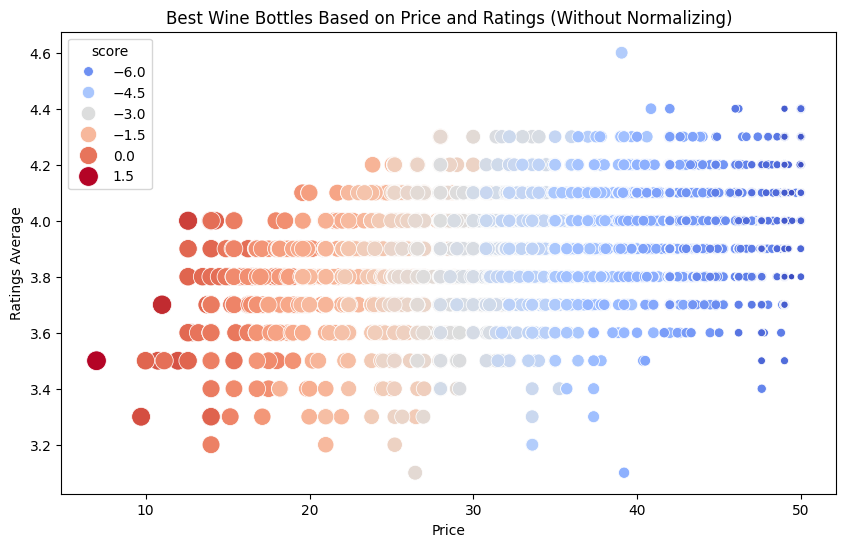

In [26]:
# Define the weights for each factor (adjust as needed)
w_rating = 0.4
w_acidity = 0.2
w_tannin = 0.2
w_price = 0.2

# Calculate the score for each wine based on the weights using original values (no normalization)
# Note: We use the original 'amount' (price) without normalizing it.
all_filtered_winebottle_v1_clean['score'] = (
    w_rating * all_filtered_winebottle_v1_clean['ratings_average'] +
    w_acidity * all_filtered_winebottle_v1_clean['Acidity'] +
    w_tannin * all_filtered_winebottle_v1_clean['Tannin'] +
    w_price * (1 - all_filtered_winebottle_v1_clean['amount'])  # Assuming lower price is better
)

# Sort the wines by score (highest score first) and filter by price range (e.g., below $50)
best_bottles = all_filtered_winebottle_v1_clean[all_filtered_winebottle_v1_clean['amount'] <= 50].sort_values(by='score', ascending=False)

# Display the top wine with its details (name, year, price, rating, etc.)
top_wine = best_bottles[['name_x', 'year', 'amount', 'ratings_average', 'Acidity', 'Tannin', 'score']].head(1)
print("Best Wine Without Normalizing:")
print(top_wine)

# Optionally, visualize the best wines without normalization
plt.figure(figsize=(10, 6))
sns.scatterplot(x='amount', y='ratings_average', hue='score', data=best_bottles, palette='coolwarm', size='score', sizes=(20, 200))
plt.title('Best Wine Bottles Based on Price and Ratings (Without Normalizing)')
plt.xlabel('Price')
plt.ylabel('Ratings Average')
plt.show()


C:\Users\masca\AppData\Local\Temp\ipykernel_38648\259692338.py:38: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  best_bottles_in_range = all_filtered_winebottle_v1_clean.groupby('price_range').apply(
C:\Users\masca\AppData\Local\Temp\ipykernel_38648\259692338.py:38: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  best_bottles_in_range = all_filtered_winebottle_v1_clean.groupby('price_range').apply(


Best Wines in Each Price Range:
   price_range                                             name_x    year  \
0         0-30  Beringer Beringer Bros. Bourbon Barrel Aged Ca...  2016.0   
1         0-30                                 Alamos Malbec 2019  2019.0   
2         0-30                     Bread & Butter Pinot Noir 2021  2021.0   
3        30-60                                 Catena Malbec 2019  2019.0   
4        30-60                      Rutini Cabernet - Malbec 2016  2016.0   
5        30-60               Marqués de Riscal Rioja Reserva 2018  2018.0   
6       60-100    Austin Hope Austin Hope Cabernet Sauvignon 2020  2020.0   
7       60-100    Zenato Amarone della Valpolicella Classico 2017  2017.0   
8       60-100              Barbanera Gigino 80 Anniversario 2018  2018.0   
9      100-150               Bodegas Faustino I Gran Reserva 2004  2004.0   
10     100-150  Masi Costasera Amarone della Valpolicella Clas...  2016.0   
11     100-150           Hall Napa Valley Ca

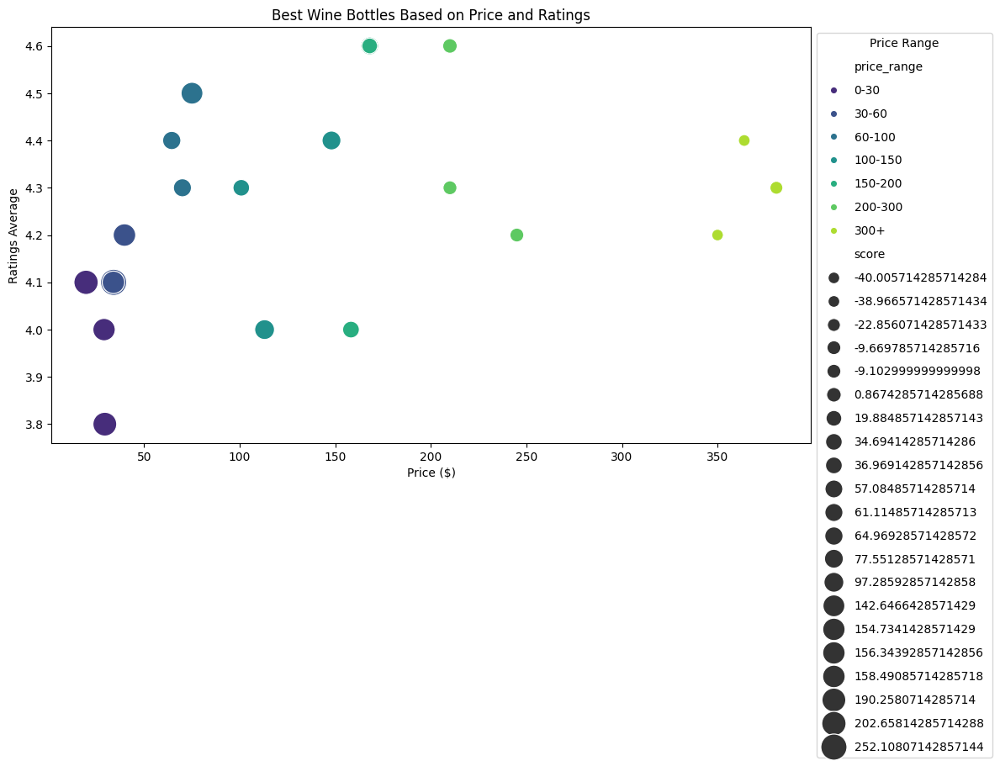

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define the weights for each factor (adjust as needed)
w_rating = 0.4        # Rating still plays a role, moderate weight
w_acidity = 0.1       # Higher weight for acidity to capture freshness
w_tannin = 0.1       # Lower weight for tannin to focus on smoother wines
w_price = 0.2         # Keep price lower as a secondary factor
w_reviews_count = 0.05 # Reviews count can still be a factor, but less so
w_intensity = 0.1     # Moderate weight for intensity to reflect flavor richness
w_sweetness = 0.05    # Lower weight for sweetness since it's often not a key factor

# Normalize features like acidity, tannin, intensity, and sweetness
all_filtered_winebottle_v1_clean['Acidity_norm'] = (all_filtered_winebottle_v1_clean['Acidity'] - all_filtered_winebottle_v1_clean['Acidity'].min()) / (all_filtered_winebottle_v1_clean['Acidity'].max() - all_filtered_winebottle_v1_clean['Acidity'].min())
all_filtered_winebottle_v1_clean['Tannin_norm'] = (all_filtered_winebottle_v1_clean['Tannin'] - all_filtered_winebottle_v1_clean['Tannin'].min()) / (all_filtered_winebottle_v1_clean['Tannin'].max() - all_filtered_winebottle_v1_clean['Tannin'].min())
all_filtered_winebottle_v1_clean['Intensity_norm'] = (all_filtered_winebottle_v1_clean['Intensity'] - all_filtered_winebottle_v1_clean['Intensity'].min()) / (all_filtered_winebottle_v1_clean['Intensity'].max() - all_filtered_winebottle_v1_clean['Intensity'].min())

# Calculate the score for each wine based on the weights and normalized factors
all_filtered_winebottle_v1_clean['score'] = (
    w_rating * all_filtered_winebottle_v1_clean['ratings_average'] +
    w_acidity * all_filtered_winebottle_v1_clean['Acidity_norm'] +
    w_tannin * all_filtered_winebottle_v1_clean['Tannin_norm'] +
    w_price * (1 - all_filtered_winebottle_v1_clean['amount']) +  # Assuming lower price is better
    w_reviews_count * all_filtered_winebottle_v1_clean['reviews_count'] +  # Higher reviews count may indicate better reputation
    w_intensity * all_filtered_winebottle_v1_clean['Intensity_norm'] +  # Intensity can add to wine quality
    w_sweetness * all_filtered_winebottle_v1_clean['Sweetness']  # Sweetness can affect preference
)

# Define price ranges as bins
price_bins = [0, 30, 60, 100, 150, 200, 300, float('inf')]
price_labels = ['0-30', '30-60', '60-100', '100-150', '150-200', '200-300', '300+']

# Create a new column for the price range
all_filtered_winebottle_v1_clean['price_range'] = pd.cut(all_filtered_winebottle_v1_clean['amount'], bins=price_bins, labels=price_labels)

# Group by price range and sort each group by score, then pick the top wine(s) in each range
best_bottles_in_range = all_filtered_winebottle_v1_clean.groupby('price_range').apply(
    lambda x: x.sort_values(by='score', ascending=False).head(3)  # Show top 3 wines in each range
).reset_index(drop=True)

# Display the best wines in each price range
print("Best Wines in Each Price Range:")
print(best_bottles_in_range[['price_range', 'name_x', 'year', 'amount', 'ratings_average', 'Acidity', 'Tannin', 'reviews_count', 'Intensity', 'Sweetness', 'score']])

# Visualization: Plotting the best wines across price ranges
plt.figure(figsize=(12, 8))

# Scatter plot with hue for price range and size for score
sns.scatterplot(data=best_bottles_in_range, 
                x='amount', 
                y='ratings_average', 
                hue='price_range', 
                palette='viridis', 
                size='score', 
                sizes=(100, 500), 
                legend='full')

# Remove the 'score' from the legend by setting legend to 'brief' and hiding the 'size' legend
plt.legend(title='Price Range', loc='upper left', bbox_to_anchor=(1, 1), labelspacing=1)

# Adding titles and labels
plt.title('Best Wine Bottles Based on Price and Ratings')
plt.xlabel('Price ($)')
plt.ylabel('Ratings Average')
plt.tight_layout()

# Show the plot
plt.show()


C:\Users\masca\AppData\Local\Temp\ipykernel_38648\2516785906.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dry_wines['Acidity_norm'] = (dry_wines['Acidity'] - dry_wines['Acidity'].min()) / (dry_wines['Acidity'].max() - dry_wines['Acidity'].min())
C:\Users\masca\AppData\Local\Temp\ipykernel_38648\2516785906.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dry_wines['Tannin_norm'] = (dry_wines['Tannin'] - dry_wines['Tannin'].min()) / (dry_wines['Tannin'].max() - dry_wines['Tannin'].min())
C:\Users\

Best Dry Wines in Each Price Range:
   price_range                                             name_x    year  \
0         0-30  Beringer Beringer Bros. Bourbon Barrel Aged Ca...  2016.0   
1         0-30                     Bread & Butter Pinot Noir 2021  2021.0   
2         0-30             Casa Ferreirinha Papa Figos Douro 2016  2016.0   
3        30-60                      Rutini Cabernet - Malbec 2016  2016.0   
4        30-60               Marqués de Riscal Rioja Reserva 2018  2018.0   
5        30-60            Bodegas Marqués de Cáceres Crianza 2017  2017.0   
6       60-100    Austin Hope Austin Hope Cabernet Sauvignon 2020  2020.0   
7       60-100              Barbanera Gigino 80 Anniversario 2018  2018.0   
8       60-100                      Faust Cabernet Sauvignon 2016  2016.0   
9      100-150               Bodegas Faustino I Gran Reserva 2004  2004.0   
10     100-150                           Montes Purple Angel 2015  2015.0   
11     100-150           Hall Napa Valle

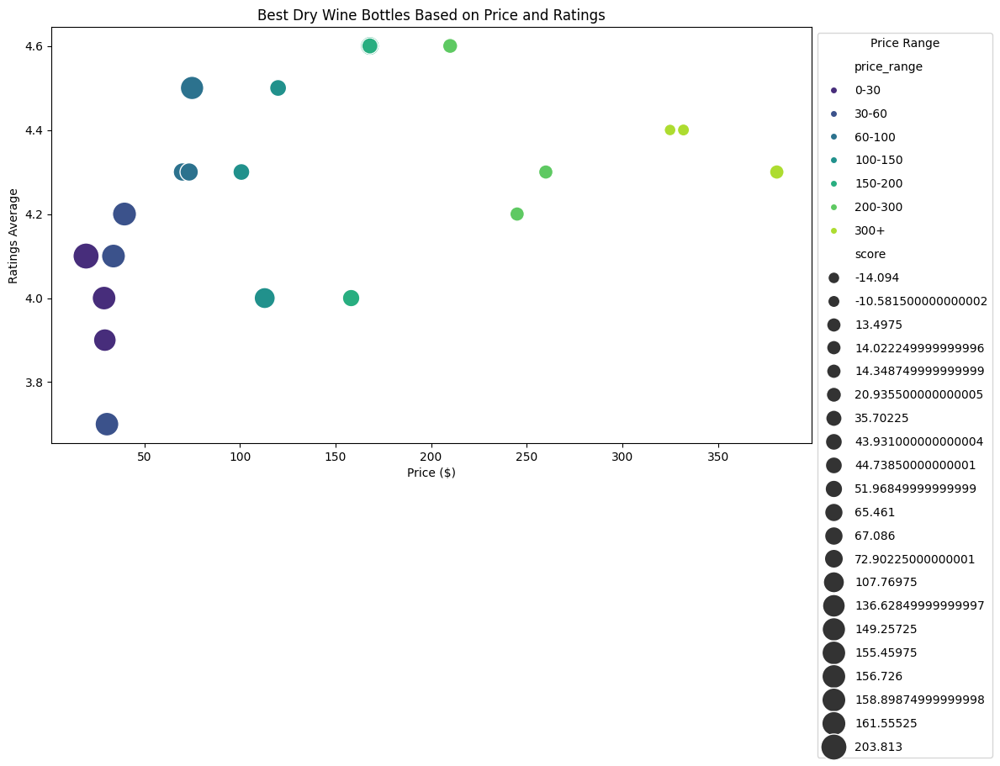

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Filter for dry wines based on sweetness, acidity, and intensity
# For dry wines, sweetness should be lower, and acidity should be moderate to high
dry_wines = all_filtered_winebottle_v1_clean[
    (all_filtered_winebottle_v1_clean['Sweetness'] < 2) &        # Lower sweetness (e.g., less than 2 for dry wines)
    (all_filtered_winebottle_v1_clean['Acidity'] >= 3) &         # Moderate to high acidity (more refreshing for dry wines)
    (all_filtered_winebottle_v1_clean['Intensity'] >= 3)         # Moderate to high intensity for more complex dry wines
]

# Optional: If you want to focus on specific price ranges, you can add this as well
# dry_wines = dry_wines[dry_wines['price_range'].isin(['0-30', '30-60', '60-100'])]

# Define the weights for each factor (adjust as needed)
w_rating = 0.2        # Rating still plays a role, moderate weight
w_acidity = 0.25      # Higher weight for acidity to capture freshness of dry wines
w_tannin = 0.05       # Lower weight for tannin to focus on smoother wines
w_price = 0.1         # Keep price lower as a secondary factor
w_reviews_count = 0.05 # Reviews count can still be a factor, but less so
w_intensity = 0.2     # Moderate weight for intensity to reflect complexity in dry wines
w_sweetness = 0.1     # Lower weight for sweetness since dry wines are typically low in sweetness

# Normalize features like acidity, tannin, intensity, and sweetness
dry_wines['Acidity_norm'] = (dry_wines['Acidity'] - dry_wines['Acidity'].min()) / (dry_wines['Acidity'].max() - dry_wines['Acidity'].min())
dry_wines['Tannin_norm'] = (dry_wines['Tannin'] - dry_wines['Tannin'].min()) / (dry_wines['Tannin'].max() - dry_wines['Tannin'].min())
dry_wines['Intensity_norm'] = (dry_wines['Intensity'] - dry_wines['Intensity'].min()) / (dry_wines['Intensity'].max() - dry_wines['Intensity'].min())

# Calculate the score for each wine based on the weights and normalized factors
dry_wines['score'] = (
    w_rating * dry_wines['ratings_average'] +
    w_acidity * dry_wines['Acidity_norm'] +
    w_tannin * dry_wines['Tannin_norm'] +
    w_price * (1 - dry_wines['amount']) +  # Assuming lower price is better
    w_reviews_count * dry_wines['reviews_count'] +  # Higher reviews count may indicate better reputation
    w_intensity * dry_wines['Intensity_norm'] +  # Intensity can add to wine quality
    w_sweetness * dry_wines['Sweetness']  # Sweetness should be lower for dry wines
)

# Define price ranges as bins
price_bins = [0, 30, 60, 100, 150, 200, 300, float('inf')]
price_labels = ['0-30', '30-60', '60-100', '100-150', '150-200', '200-300', '300+']

# Create a new column for the price range
dry_wines['price_range'] = pd.cut(dry_wines['amount'], bins=price_bins, labels=price_labels)

# Group by price range and sort each group by score, then pick the top wine(s) in each range
best_bottles_in_range = dry_wines.groupby('price_range').apply(
    lambda x: x.sort_values(by='score', ascending=False).head(3)  # Show top 3 wines in each range
).reset_index(drop=True)

# Display the best dry wines in each price range
print("Best Dry Wines in Each Price Range:")
print(best_bottles_in_range[['price_range', 'name_x', 'year', 'amount', 'ratings_average', 'Acidity', 'Tannin', 'reviews_count', 'Intensity', 'Sweetness', 'score']])

# Visualization: Plotting the best wines across price ranges
plt.figure(figsize=(12, 8))

# Scatter plot with hue for price range and size for score
sns.scatterplot(data=best_bottles_in_range, 
                x='amount', 
                y='ratings_average', 
                hue='price_range', 
                palette='viridis', 
                size='score', 
                sizes=(100, 500), 
                legend='full')

# Remove the 'score' from the legend by setting legend to 'brief' and hiding the 'size' legend
plt.legend(title='Price Range', loc='upper left', bbox_to_anchor=(1, 1), labelspacing=1)

# Adding titles and labels
plt.title('Best Dry Wine Bottles Based on Price and Ratings')
plt.xlabel('Price ($)')
plt.ylabel('Ratings Average')
plt.tight_layout()

# Show the plot
plt.show()


C:\Users\masca\AppData\Local\Temp\ipykernel_38648\567233664.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sweet_wines['Acidity_norm'] = (sweet_wines['Acidity'] - sweet_wines['Acidity'].min()) / (sweet_wines['Acidity'].max() - sweet_wines['Acidity'].min())
C:\Users\masca\AppData\Local\Temp\ipykernel_38648\567233664.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sweet_wines['Tannin_norm'] = (sweet_wines['Tannin'] - sweet_wines['Tannin'].min()) / (sweet_wines['Tannin'].max() - sweet_wines['Tannin'

Best Sweet Wines in Each Price Range:
   price_range                                             name_x    year  \
0         0-30  Masca del Tacco Lu Rappaio Primitivo di Mandur...  2020.0   
1         0-30               Masca del Tacco Lu'Li Appassite 2019  2019.0   
2         0-30                             Cantele Primitivo 2016  2016.0   
3        30-60         Casalforte Amarone della Valpolicella 2015  2015.0   
4        30-60      Varvaglione Papale Primitivo di Manduria 2017  2017.0   
5        30-60  Luigi Righetti Capitel de Roari Amarone della ...  2016.0   
6       60-100    Zenato Amarone della Valpolicella Classico 2017  2017.0   
7       60-100  Domini Veneti Amarone della Valpolicella Class...  2015.0   
8       60-100  Masi Costasera Amarone della Valpolicella Clas...  2017.0   
9      100-150  Masi Costasera Amarone della Valpolicella Clas...  2016.0   
10     100-150  Zenato Amarone della Valpolicella Classico Ris...  2017.0   
11     100-150  Le Salette La Marega A

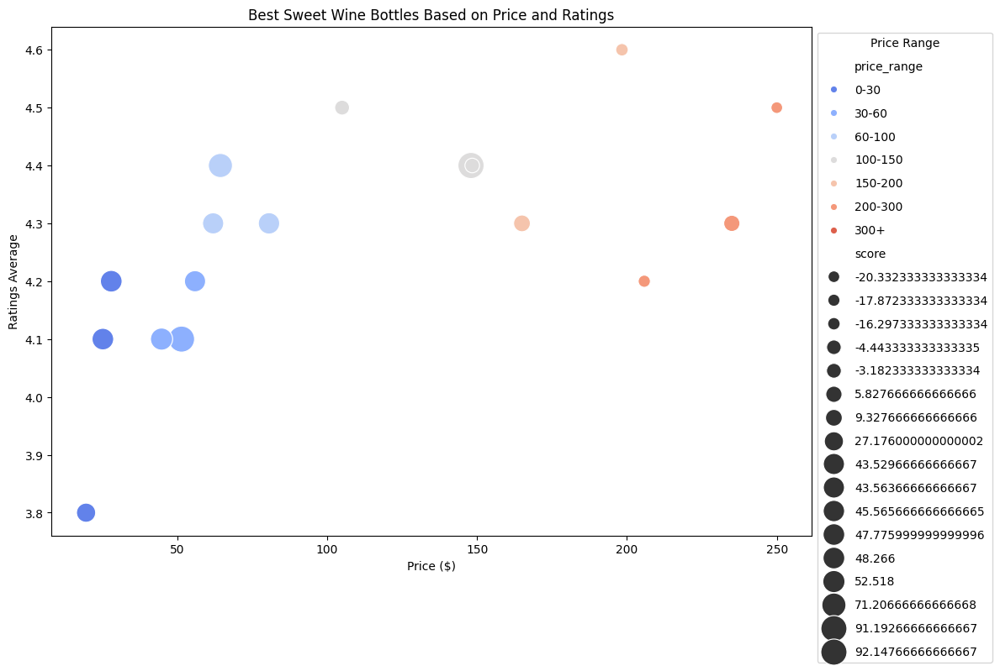

In [51]:
# Filter for sweet wines based on sweetness, acidity, and intensity
# We consider Sweetness > 2 to identify wines with higher sweetness

sweet_wines = all_filtered_winebottle_v1_clean[
    (all_filtered_winebottle_v1_clean['Sweetness'] > 2) &         # Higher sweetness for sweet wines
    (all_filtered_winebottle_v1_clean['Acidity'] <= 3.5) &        # Moderate to low acidity (since sweeter wines tend to be less acidic)
    (all_filtered_winebottle_v1_clean['Intensity'] >= 3)          # Moderate to high intensity for a richer, more complex flavor
]

# Optional: If you want to focus on specific price ranges, you can add this as well
# sweet_wines = sweet_wines[sweet_wines['price_range'].isin(['0-30', '30-60', '60-100'])]

# Display the filtered sweet wines
# print(sweet_wines)

# Define the weights for each factor (adjust as needed)
w_rating = 0.2        # Rating still plays a role, moderate weight
w_acidity = 0.2       # Lower weight for acidity since sweet wines tend to have lower acidity
w_tannin = 0.05       # Lower weight for tannin, focusing on smoother wines
w_price = 0.1         # Keep price lower as a secondary factor
w_reviews_count = 0.05 # Reviews count can still be a factor, but less so
w_intensity = 0.25    # Moderate weight for intensity to reflect the richness of sweet wines
w_sweetness = 0.25    # Higher weight for sweetness, as it's a key factor for sweet wines

# Normalize features like acidity, tannin, intensity, and sweetness
sweet_wines['Acidity_norm'] = (sweet_wines['Acidity'] - sweet_wines['Acidity'].min()) / (sweet_wines['Acidity'].max() - sweet_wines['Acidity'].min())
sweet_wines['Tannin_norm'] = (sweet_wines['Tannin'] - sweet_wines['Tannin'].min()) / (sweet_wines['Tannin'].max() - sweet_wines['Tannin'].min())
sweet_wines['Intensity_norm'] = (sweet_wines['Intensity'] - sweet_wines['Intensity'].min()) / (sweet_wines['Intensity'].max() - sweet_wines['Intensity'].min())

# Calculate the score for each wine based on the weights and normalized factors
sweet_wines['score'] = (
    w_rating * sweet_wines['ratings_average'] +
    w_acidity * sweet_wines['Acidity_norm'] +
    w_tannin * sweet_wines['Tannin_norm'] +
    w_price * (1 - sweet_wines['amount']) +  # Assuming lower price is better
    w_reviews_count * sweet_wines['reviews_count'] +  # Higher reviews count may indicate better reputation
    w_intensity * sweet_wines['Intensity_norm'] +  # Intensity adds to wine complexity
    w_sweetness * sweet_wines['Sweetness']  # Sweetness is more important for sweet wines
)

# Define price ranges as bins
price_bins = [0, 30, 60, 100, 150, 200, 300, float('inf')]
price_labels = ['0-30', '30-60', '60-100', '100-150', '150-200', '200-300', '300+']

# Create a new column for the price range
sweet_wines['price_range'] = pd.cut(sweet_wines['amount'], bins=price_bins, labels=price_labels)

# Group by price range and sort each group by score, then pick the top wine(s) in each range
best_sweet_bottles_in_range = sweet_wines.groupby('price_range').apply(
    lambda x: x.sort_values(by='score', ascending=False).head(3)  # Show top 3 wines in each range
).reset_index(drop=True)

# Display the best sweet wines in each price range
print("Best Sweet Wines in Each Price Range:")
print(best_sweet_bottles_in_range[['price_range', 'name_x', 'year', 'amount', 'ratings_average', 'Acidity', 'Tannin', 'reviews_count', 'Intensity', 'Sweetness', 'score']])

# Visualization: Plotting the best sweet wines across price ranges
plt.figure(figsize=(12, 8))

# Scatter plot with hue for price range and size for score
sns.scatterplot(data=best_sweet_bottles_in_range, 
                x='amount', 
                y='ratings_average', 
                hue='price_range', 
                palette='coolwarm', 
                size='score', 
                sizes=(100, 500), 
                legend='full')

# Remove the 'score' from the legend by setting legend to 'brief' and hiding the 'size' legend
plt.legend(title='Price Range', loc='upper left', bbox_to_anchor=(1, 1), labelspacing=1)

# Adding titles and labels
plt.title('Best Sweet Wine Bottles Based on Price and Ratings')
plt.xlabel('Price ($)')
plt.ylabel('Ratings Average')
plt.tight_layout()

# Show the plot
plt.show()


C:\Users\masca\AppData\Local\Temp\ipykernel_38648\1360959626.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  medium_dry_wines['Acidity_norm'] = (medium_dry_wines['Acidity'] - medium_dry_wines['Acidity'].min()) / (medium_dry_wines['Acidity'].max() - medium_dry_wines['Acidity'].min())
C:\Users\masca\AppData\Local\Temp\ipykernel_38648\1360959626.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  medium_dry_wines['Tannin_norm'] = (medium_dry_wines['Tannin'] - medium_dry_wines['Tannin'].min()) / (medium_d

Best Medium Dry Wines in Each Price Range:
   price_range                                             name_x    year  \
0         0-30  Tenuta Sant'Antonio Monti Garbi Valpolicella R...  2018.0   
1         0-30  Masca del Tacco Lu Rappaio Primitivo di Mandur...  2020.0   
2         0-30               Masca del Tacco Lu'Li Appassite 2019  2019.0   
3        30-60  Clos de los Siete Clos de Los Siete (by Michel...  2019.0   
4        30-60  Tommasi Valpolicella Ripasso (Classico Superio...  2017.0   
5        30-60  Zenato Ripassa Valpolicella Ripasso Superiore ...  2019.0   
6       60-100                Occhipinti Il Frappato Sicilia 2018  2018.0   
7       60-100  Vigneti del Salento Vigne Vecchie Primitivo di...  2012.0   
8       60-100                Occhipinti Il Frappato Sicilia 2016  2016.0   
9      100-150  Cantine del Notaio La Firma Aglianico del Vult...  2013.0   
10     100-150  Louis M. Martini Monte Rosso Vineyard Gnarly V...  2014.0   
11     100-150  Cantine del Notai

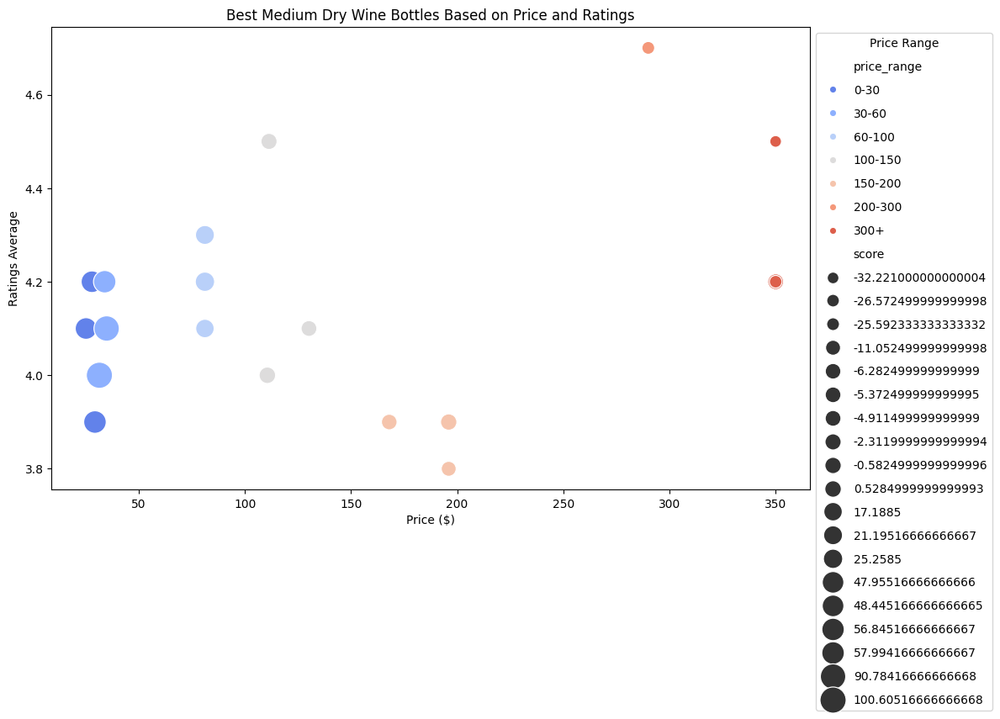

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Filter for medium dry wines based on sweetness, acidity, and intensity
# We consider Sweetness between 1.5 and 2.5 to identify wines with moderate sweetness
medium_dry_wines = all_filtered_winebottle_v1_clean[
    (all_filtered_winebottle_v1_clean['Sweetness'] > 1.5) &         # Moderate sweetness for medium dry wines
    (all_filtered_winebottle_v1_clean['Sweetness'] <= 2.5) &       # Ensure the sweetness is within the medium dry range
    (all_filtered_winebottle_v1_clean['Acidity'] <= 3.5) &        # Moderate to low acidity
    (all_filtered_winebottle_v1_clean['Intensity'] >= 2)           # Moderate intensity for a balanced profile
]

# Optional: If you want to focus on specific price ranges, you can add this as well
# medium_dry_wines = medium_dry_wines[medium_dry_wines['price_range'].isin(['0-30', '30-60', '60-100'])]

# Define the weights for each factor (adjust as needed)
w_rating = 0.2        # Rating still plays a role, moderate weight
w_acidity = 0.2       # Lower weight for acidity, as medium dry wines tend to have moderate acidity
w_tannin = 0.05       # Lower weight for tannin, focusing on smoother wines
w_price = 0.1         # Keep price lower as a secondary factor
w_reviews_count = 0.05 # Reviews count can still be a factor, but less so
w_intensity = 0.25    # Moderate weight for intensity to reflect the balance and complexity
w_sweetness = 0.25    # Sweetness is important but slightly less than intensity for medium dry wines

# Normalize features like acidity, tannin, intensity, and sweetness
medium_dry_wines['Acidity_norm'] = (medium_dry_wines['Acidity'] - medium_dry_wines['Acidity'].min()) / (medium_dry_wines['Acidity'].max() - medium_dry_wines['Acidity'].min())
medium_dry_wines['Tannin_norm'] = (medium_dry_wines['Tannin'] - medium_dry_wines['Tannin'].min()) / (medium_dry_wines['Tannin'].max() - medium_dry_wines['Tannin'].min())
medium_dry_wines['Intensity_norm'] = (medium_dry_wines['Intensity'] - medium_dry_wines['Intensity'].min()) / (medium_dry_wines['Intensity'].max() - medium_dry_wines['Intensity'].min())

# Calculate the score for each wine based on the weights and normalized factors
medium_dry_wines['score'] = (
    w_rating * medium_dry_wines['ratings_average'] +
    w_acidity * medium_dry_wines['Acidity_norm'] +
    w_tannin * medium_dry_wines['Tannin_norm'] +
    w_price * (1 - medium_dry_wines['amount']) +  # Assuming lower price is better
    w_reviews_count * medium_dry_wines['reviews_count'] +  # Higher reviews count may indicate better reputation
    w_intensity * medium_dry_wines['Intensity_norm'] +  # Intensity adds to wine complexity
    w_sweetness * medium_dry_wines['Sweetness']  # Sweetness is more important for medium dry wines
)

# Define price ranges as bins
price_bins = [0, 30, 60, 100, 150, 200, 300, float('inf')]
price_labels = ['0-30', '30-60', '60-100', '100-150', '150-200', '200-300', '300+']

# Create a new column for the price range
medium_dry_wines['price_range'] = pd.cut(medium_dry_wines['amount'], bins=price_bins, labels=price_labels)

# Group by price range and sort each group by score, then pick the top wine(s) in each range
best_medium_dry_bottles_in_range = medium_dry_wines.groupby('price_range').apply(
    lambda x: x.sort_values(by='score', ascending=False).head(3)  # Show top 3 wines in each range
).reset_index(drop=True)

# Display the best medium dry wines in each price range
print("Best Medium Dry Wines in Each Price Range:")
print(best_medium_dry_bottles_in_range[['price_range', 'name_x', 'year', 'amount', 'ratings_average', 'Acidity', 'Tannin', 'reviews_count', 'Intensity', 'Sweetness', 'score']])

# Visualization: Plotting the best medium dry wines across price ranges
plt.figure(figsize=(12, 8))

# Scatter plot with hue for price range and size for score
sns.scatterplot(data=best_medium_dry_bottles_in_range, 
                x='amount', 
                y='ratings_average', 
                hue='price_range', 
                palette='coolwarm', 
                size='score', 
                sizes=(100, 500), 
                legend='full')

# Remove the 'score' from the legend by setting legend to 'brief' and hiding the 'size' legend
plt.legend(title='Price Range', loc='upper left', bbox_to_anchor=(1, 1), labelspacing=1)

# Adding titles and labels
plt.title('Best Medium Dry Wine Bottles Based on Price and Ratings')
plt.xlabel('Price ($)')
plt.ylabel('Ratings Average')
plt.tight_layout()

# Show the plot
plt.show()
